#### Group19:
- Jianting Liu(8950907)
- Marieth Perez（9016702）



# Anime Face with GAN

This project aims to develop a Generative Adversarial Network (GAN) for creating high-quality anime-style facial images, leveraging a comprehensive dataset of over 63,000 anime character faces. 

The practical applications include character design assistance for animation studios, game developers, and digital artists, potentially streamlining the creative process while maintaining artistic integrity. The project also serves as a valuable case study in domain-specific image generation, contributing to the broader field of AI-powered creative tools


#### Import Libraries

In [4]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.transform import Rotation

2024-12-10 16:34:18.953318: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### EDA - exploring anime face dataset

Dataset download in kaggle: https://www.kaggle.com/code/gabrielvieiracruz/anime-face-dcgan

### Load and Visualize Images

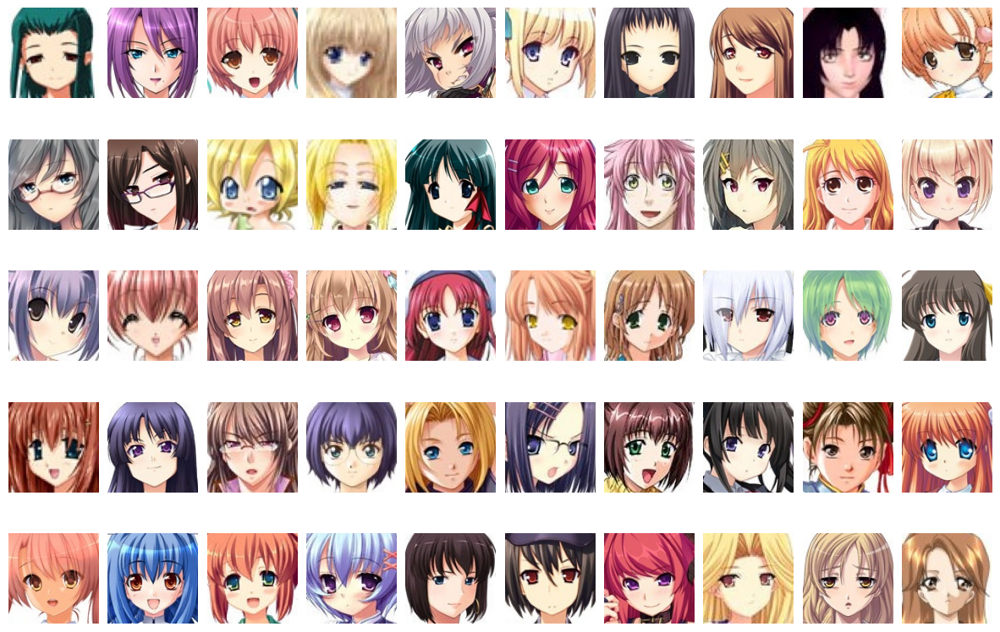

In [19]:
### 
import matplotlib.pyplot as plt
import os
from PIL import Image

# Set the dataset path
dataset_path = "./data/animator2/"

# Load the images (adjust the number if you have fewer images in the dataset)
all_images = os.listdir(dataset_path)[:50]  # Select the first 50 images

# Number of rows and columns
rows, cols = 5, 10

# Create the subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))  # Adjusted figsize for better spacing

# Flatten the axes for easier indexing
axes = axes.flatten()

# Loop through images and display them
for i, img_name in enumerate(all_images):
    img_path = os.path.join(dataset_path, img_name)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis("off")  # Remove axes for a cleaner look

# Hide any remaining axes if fewer than 50 images are available
for ax in axes[len(all_images):]:
    ax.axis("off")

# Adjust spacing to reduce the gap
plt.subplots_adjust(wspace=0.1, hspace=0.05)  # Adjust horizontal and vertical spacing
plt.show()



In [27]:
print("this dataset contains :",len(os.listdir(dataset_path)))

this dataset contains : 63565


#### Color Channels

In [22]:

img = Image.open(img_path)
print("Color mode:", img.mode)  # Output: "RGB", "L", "RGBA", etc.

Color mode: RGB


#### Histogram Analysis

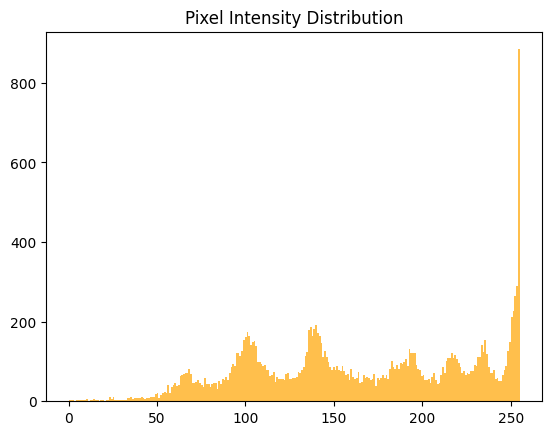

In [23]:

img = Image.open(img_path)
plt.hist(np.array(img).ravel(), bins=256, color='orange', alpha=0.7)
plt.title("Pixel Intensity Distribution")
plt.show()

Bright image: The image (or set of images) is generally bright, with more white or light gray regions dominating the pixel intensity.

#### Data Quality Checks
- Duplicates

In [25]:

import hashlib

def calculate_hash(image_path):
    with open(image_path, "rb") as f:
        return hashlib.md5(f.read()).hexdigest()

hashes = {}
duplicates = []
for img_name in os.listdir(dataset_path):
    img_path = os.path.join(dataset_path, img_name)
    img_hash = calculate_hash(img_path)
    if img_hash in hashes:
        duplicates.append(img_name)
    else:
        hashes[img_hash] = img_name
print("Duplicate images:", len(duplicates))
#print(duplicates)

Duplicate images: 22043


##### reshape images from local directory

In [9]:
import os
import numpy as np
from PIL import Image
import tensorflow as tf

def load_local_image_dataset(data_dir, img_height=28, img_width=28):
   """
   Load color image dataset from local directory
   
   Args:
       data_dir: Image directory path
       img_height: Target image height (default 28)
       img_width: Target image width (default 28)
   
   Returns:
       x_train: numpy array with shape (n_samples, height, width, 3)
   """
   images = []
   
   # Iterate through all images in directory
   for img_name in os.listdir(data_dir):
       if not img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
           continue
           
       img_path = os.path.join(data_dir, img_name)
       try:
           # Read color image (RGB mode)
           img = Image.open(img_path)
           # Resize image to uniform size
           img = img.resize((img_width, img_height))
           # Convert to numpy array and normalize to [0,1]
           img_array = np.array(img) / 255.0
           images.append(img_array)
           
       except Exception as e:
           print(f"Error processing {img_path}: {e}")
           continue
   
   # Convert to numpy array
   x_train = np.array(images)
   
   # Shuffle dataset
   np.random.shuffle(x_train)
   
   return x_train

# Usage example:
data_dir = "./data/animator2/"
x_train_data = load_local_image_dataset(data_dir)

# Print dataset info
print(f"Dataset size: {len(x_train_data)}")
print(f"Image shape: {x_train_data.shape}")  # Should be (n_samples, height, width, 3)

Dataset size: 63565
Image shape: (63565, 28, 28, 3)


#### Split data into train, validation, test

In [10]:
# Load the data
#x_train_data = load_local_image_dataset(data_dir)

# Since we don't have a predefined test set, let's create train/test split
# Using 80% for training and 20% for testing
test_split = int(len(x_train_data) * 0.8)
X_train_full = x_train_data[:test_split].astype(np.float32)
X_test = x_train_data[test_split:].astype(np.float32)

# Now create validation set from training set
# Take last 5000 samples for validation
X_train = X_train_full[:-5000]
X_valid = X_train_full[-5000:]

print(f"Training set shape: {X_train.shape}")
print(f"Validation set shape: {X_valid.shape}")
print(f"Test set shape: {X_test.shape}")

Training set shape: (45852, 28, 28, 3)
Validation set shape: (5000, 28, 28, 3)
Test set shape: (12713, 28, 28, 3)


In [28]:
def plot_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = np.clip(model.predict(images[:n_images]), 0, 1)
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plt.imshow(images[image_index], cmap="binary")
        plt.axis("off")
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plt.imshow(reconstructions[image_index], cmap="binary")
        plt.axis("off")

In [29]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = images.squeeze(axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

In [30]:
tf.random.set_seed(42)  # ensures reproducibility on CPU

In [32]:
Dense = tf.keras.layers.Dense  # useful shorthand

In [44]:
generator = tf.keras.Sequential([
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(28 * 28 * 3, activation="sigmoid"),
    tf.keras.layers.Reshape([28, 28,3])
])

In [45]:
discriminator = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=[28, 28, 3]),  # Changed input shape for RGB
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(1, activation="sigmoid")
])

In [46]:
gan = tf.keras.Sequential([generator, discriminator])

In [47]:
# binary crossentropy is used because the discriminator is a binary classifier
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [48]:
discriminator.trainable = False

In [49]:
# binary_crossentropy is used because the generator is trained based on the discriminator output
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [50]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [51]:
# codings_size is the size of the noise vector fed to the generator
codings_size = 30

In [63]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs):
    """
    Trains a GAN for a fixed number of epochs.
    """

    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print(f"Epoch {epoch + 1}/{n_epochs}")
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            gan.train_on_batch(noise, y2)
        # extra code — plot images during training
        plot_multiple_images(generated_images.numpy(), 8)
        plt.show()

Note: The following cell with 50 epochs will run for about 4 hours on a CPU. The number of epochs was changed from 5 to 50 below due to training time of a CPU. Training for 50 epochs results in better images.

The images generated are all of the images generated in the last batch of every epoch.

Epoch 1/5


2024-12-10 19:31:55.516903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [45852,28,28,3]
	 [[{{node Placeholder/_0}}]]
2024-12-10 19:31:55.639854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 19:31:56.234812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape

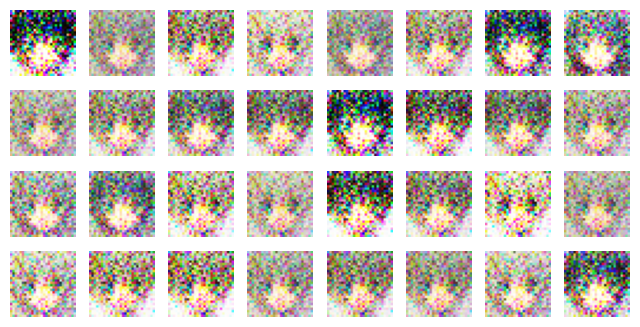

Epoch 2/5


2024-12-10 19:32:53.111435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 19:32:53.126267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [32,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 19:32:53.152581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	

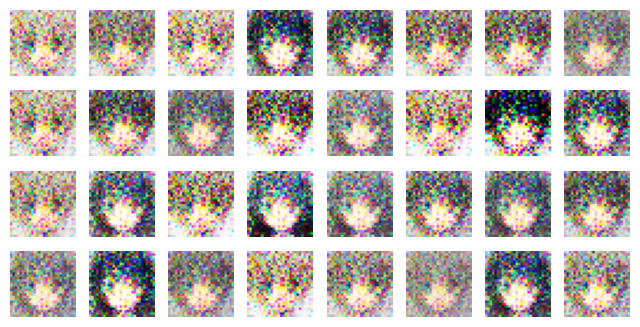

Epoch 3/5


2024-12-10 19:33:48.605065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 19:33:48.621238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [32,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 19:33:48.656143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	

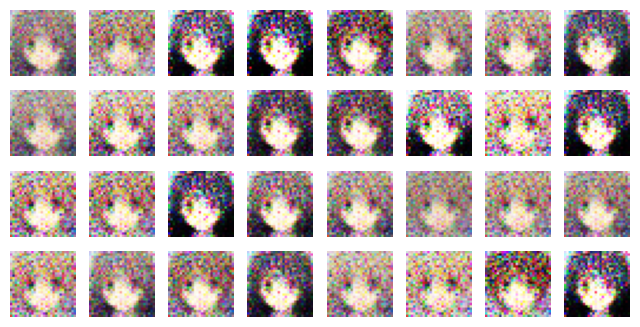

Epoch 4/5


2024-12-10 19:34:44.238640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 19:34:44.252317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [32,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 19:34:44.291270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	

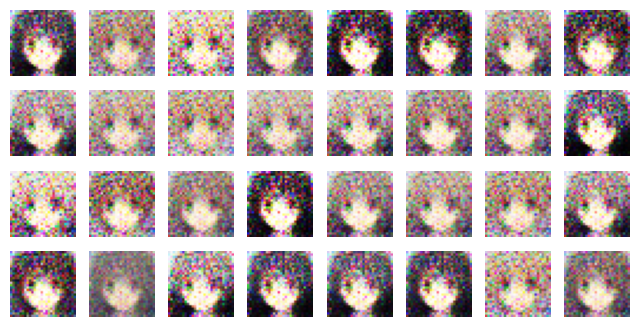

Epoch 5/5


2024-12-10 19:35:40.134683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 19:35:40.149442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [32,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 19:35:40.187414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	

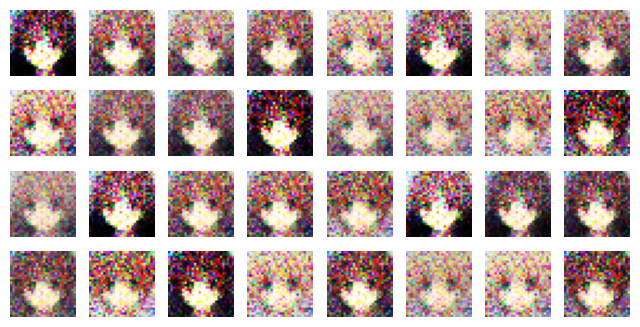

In [53]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=5)

In [54]:
tf.random.set_seed(42)

In [55]:
codings = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(codings)

1/1 [==============================] - 0s 270ms/step


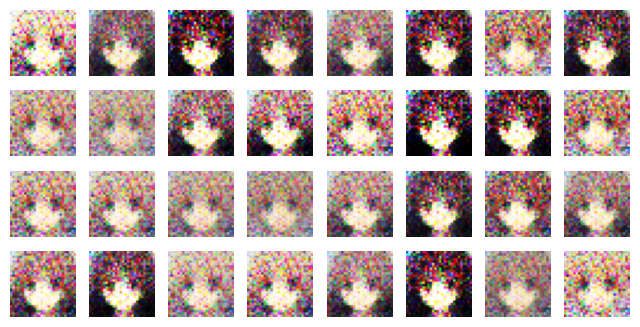

In [56]:
plot_multiple_images(generated_images, 8)
plt.show()

# Deep Convolutional GAN

In [65]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on CPU

codings_size = 100


# Generator
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(7 * 7 * 128, activation="relu", kernel_initializer="he_normal"),
    tf.keras.layers.Reshape([7, 7, 128]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(32, kernel_size=5, strides=2, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(3, kernel_size=5, strides=1, padding="same", activation="tanh"),
])

# Adjusted generator output shape: (28, 28, 3)

# Discriminator
discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="same", input_shape=[28, 28, 3], activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="same", activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid"),
])

# GAN
gan = tf.keras.Sequential([generator, discriminator])



In [66]:
# extra code – compiles the discrimator and the gan, as earlier
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [67]:
#X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale
X_train_dcgan = X_train.reshape(-1, 28, 28, 3) * 2. - 1.

Note: The number of epochs was changed from 5 to 50 below due to training time of a CPU. Training for 50 epochs results in better images.

Epoch 1/5


2024-12-10 20:42:41.676002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [45852,28,28,3]
	 [[{{node Placeholder/_0}}]]
2024-12-10 20:42:42.060351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 20:42:43.036909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape

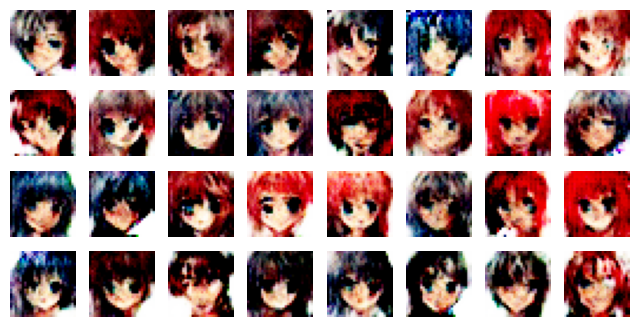

Epoch 2/5


2024-12-10 20:48:53.829766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 20:48:53.884722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [32,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 20:48:54.060709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	

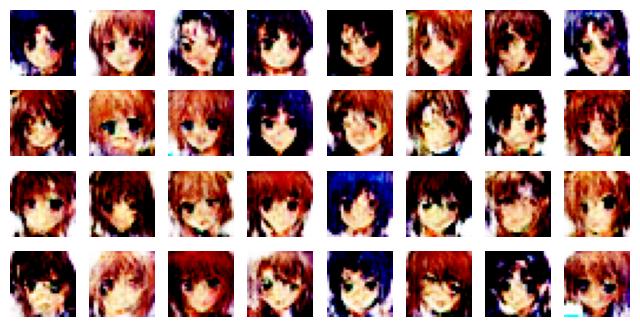

Epoch 3/5


2024-12-10 20:55:16.979138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 20:55:17.074014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [32,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 20:55:17.261486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	

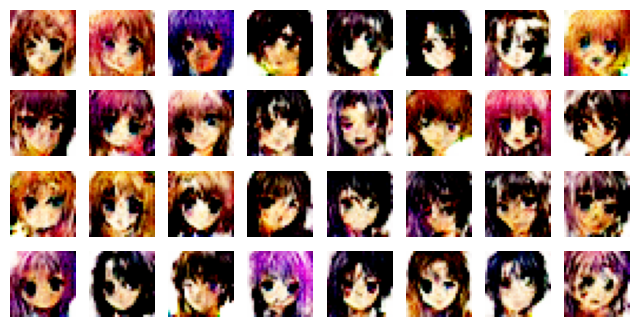

Epoch 4/5


2024-12-10 21:00:54.719045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 21:00:54.791635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [32,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 21:00:54.987147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	

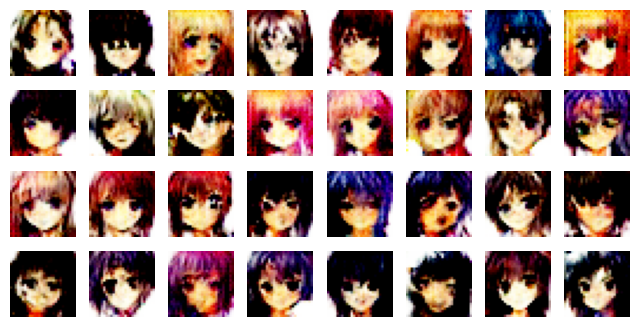

Epoch 5/5


2024-12-10 21:08:52.688594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 21:08:52.764932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [32,1]
	 [[{{node Placeholder/_1}}]]
2024-12-10 21:08:52.981357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [64,1]
	

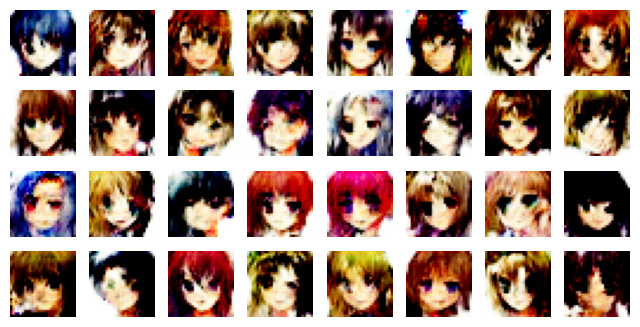

In [68]:
# extra code – generates the dataset and trains the GAN, just like earlier
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)
train_gan(gan, dataset, batch_size, codings_size, n_epochs=5)

1/1 [==============================] - 0s 416ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

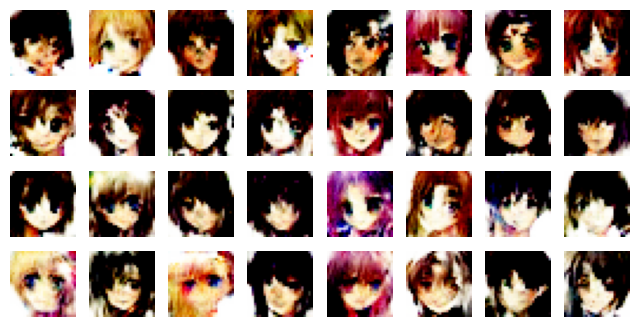

In [69]:
tf.random.set_seed(42)
noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(noise)
plot_multiple_images(generated_images, 8)

Loss

In [15]:
import matplotlib.pyplot as plt
import numpy as np

coding_size = 100
# Loss function
bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)

# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

# Lists to store loss values
generator_losses = []
discriminator_losses = []

@tf.function
def train_step(real_images, batch_size):
    # Generate random noise for generator input
    random_noise = tf.random.normal([batch_size, coding_size])

    # Train Discriminator
    with tf.GradientTape() as disc_tape:
        fake_images = generator(random_noise, training=True)
        real_output = discriminator(real_images, training=True)
        fake_output = discriminator(fake_images, training=True)

        # Compute losses
        real_loss = bce_loss(tf.ones_like(real_output), real_output)  # Real label = 1
        fake_loss = bce_loss(tf.zeros_like(fake_output), fake_output)  # Fake label = 0
        D_loss = real_loss + fake_loss

    # Apply gradients to discriminator
    disc_gradients = disc_tape.gradient(D_loss, discriminator.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))

    # Train Generator
    with tf.GradientTape() as gen_tape:
        fake_images = generator(random_noise, training=True)
        fake_output = discriminator(fake_images, training=True)

        # Compute generator loss
        G_loss = bce_loss(tf.ones_like(fake_output), fake_output)  # Fake labeled as real

    # Apply gradients to generator
    gen_gradients = gen_tape.gradient(G_loss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))

    return D_loss, G_loss

# Training loop with loss recording
def train_gan_with_loss_tracking(gan, dataset, batch_size, coding_size, n_epochs):
    for epoch in range(n_epochs):
        epoch_gen_loss = []
        epoch_disc_loss = []
        print(f"Epoch {epoch + 1}/{n_epochs}")
        for real_images in dataset:
            D_loss, G_loss = train_step(real_images, batch_size)
            epoch_disc_loss.append(D_loss)
            epoch_gen_loss.append(G_loss)

        # Average loss for the epoch
        avg_gen_loss = np.mean(epoch_gen_loss)
        avg_disc_loss = np.mean(epoch_disc_loss)
        generator_losses.append(avg_gen_loss)
        discriminator_losses.append(avg_disc_loss)

        print(f"Generator Loss: {avg_gen_loss:.4f}, Discriminator Loss: {avg_disc_loss:.4f}")

# Train the GAN with tracking
train_gan_with_loss_tracking(gan, dataset, batch_size, coding_size, n_epochs=5) # 50


Epoch 1/5


2024-12-10 16:59:51.463363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [45852,28,28,3]
	 [[{{node Placeholder/_0}}]]


Generator Loss: 0.1650, Discriminator Loss: 3.0269
Epoch 2/5
Generator Loss: 0.0220, Discriminator Loss: 4.6407
Epoch 3/5
Generator Loss: 0.0113, Discriminator Loss: 5.2743
Epoch 4/5
Generator Loss: 0.0085, Discriminator Loss: 5.5500
Epoch 5/5
Generator Loss: 0.0075, Discriminator Loss: 5.6742


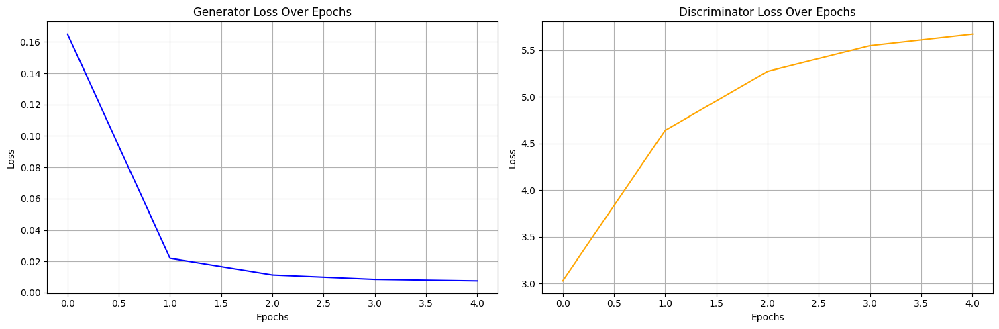

In [16]:
import pathlib
import matplotlib.pyplot as plt
# Plot loss curves in separate subplots
plt.figure(figsize=(15, 5))  # Make figure wider to accommodate two plots

# Create two subplots side by side
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first plot
plt.plot(generator_losses, color='blue')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Generator Loss Over Epochs")
plt.grid()

plt.subplot(1, 2, 2)  # 1 row, 2 columns, second plot
plt.plot(discriminator_losses, color='orange')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Discriminator Loss Over Epochs")
plt.grid()

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()